In [1]:
from pyDeepInsight import ImageTransformer, LogScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
import pandas as pd
import numpy as np

from sklearn.metrics import classification_report
from scipy import linalg as scipy_linalg
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, classification_report, plot_confusion_matrix
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import AdaBoostClassifier
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier

import itertools


In [2]:
prosody_data = pd.read_csv('Prosodic_Features_MRH.csv',sep=",")
#expr = pd.read_csv(expr_file, sep="\t")
y = prosody_data['Hired3C'].values

X = prosody_data.iloc[:, 6:].values


In [3]:
X = StandardScaler().fit_transform(X)
#X = MinMaxScaler().fit_transform(X)

In [4]:
from sklearn.decomposition import PCA
pca = PCA(n_components=20)
pca.fit(X)
X_pca = pca.transform(X)
principalDf = pd.DataFrame(data = X_pca , columns = ['PC1', 'PC2','PC3', 'PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20'])
principalDf

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,-4.168954,-0.014177,-2.475345,-0.810887,0.158383,-1.744078,-0.390702,0.265557,0.664754,1.053831,0.852551,-1.198337,0.200073,-0.733534,-1.235040,0.103746,1.158096,-0.448297,-0.798344,-0.337035
1,-4.464238,-1.009904,-3.092034,-1.055293,0.230520,-2.541514,-0.267613,0.678307,0.507352,1.239575,0.995480,-1.702560,0.455357,-0.275837,0.053691,0.166668,1.432191,-0.265933,-0.719573,-0.077403
2,-3.358534,0.101685,-2.585497,0.410778,1.336423,-2.501500,-0.698387,-0.107750,0.624623,1.094848,0.804503,-1.841722,0.020715,0.410404,0.199687,-0.220373,1.292676,-0.222873,-0.221794,0.062068
3,0.865701,-2.990583,-3.409886,3.427491,1.778394,-1.202344,0.742876,-1.396200,1.127660,-2.928788,-0.275880,-2.670820,-0.624266,-0.108623,0.953174,1.146694,1.633928,-0.565976,0.949108,0.614843
4,1.506023,-3.118672,-3.273643,1.326754,1.733809,-1.359053,1.285821,-1.184055,0.794970,-2.643696,0.574300,-1.356927,-0.637007,-0.660125,1.174424,1.340021,1.471040,-0.388209,1.198446,-0.143765
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
675,-1.722865,0.621413,-2.511901,3.169306,-2.441883,-1.714762,-0.227481,0.926876,-1.283813,0.087162,0.307395,0.515538,1.552992,0.432327,-0.029456,-0.957244,0.665800,-0.728986,0.637429,-0.352247
676,-2.157176,0.879941,-2.401855,1.721035,-2.208042,-2.682219,-0.636729,1.491811,-1.361853,0.804771,0.408119,0.674545,2.267872,0.250265,0.651259,-1.064490,0.207469,-0.407414,-0.112669,-0.122085
677,-2.407032,2.363606,-1.592129,4.621724,-3.687422,0.870559,1.078026,-1.171054,-1.566512,-2.676464,0.168665,0.383444,1.421381,1.610905,0.787189,-0.769442,0.922121,-0.664252,0.114837,-0.675432
678,-0.943823,3.709886,-0.265405,3.604097,-0.754180,-2.480952,-0.034924,1.060396,-0.914386,0.231080,0.813387,0.337742,1.709114,0.381048,0.315724,-0.862182,0.346240,-0.474710,-0.510435,-0.352261


In [5]:
finalDf = pd.concat([principalDf, prosody_data[['Hired3C']]], axis = 1)
finalDf

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,Hired3C
0,-4.168954,-0.014177,-2.475345,-0.810887,0.158383,-1.744078,-0.390702,0.265557,0.664754,1.053831,...,-1.198337,0.200073,-0.733534,-1.235040,0.103746,1.158096,-0.448297,-0.798344,-0.337035,1
1,-4.464238,-1.009904,-3.092034,-1.055293,0.230520,-2.541514,-0.267613,0.678307,0.507352,1.239575,...,-1.702560,0.455357,-0.275837,0.053691,0.166668,1.432191,-0.265933,-0.719573,-0.077403,1
2,-3.358534,0.101685,-2.585497,0.410778,1.336423,-2.501500,-0.698387,-0.107750,0.624623,1.094848,...,-1.841722,0.020715,0.410404,0.199687,-0.220373,1.292676,-0.222873,-0.221794,0.062068,1
3,0.865701,-2.990583,-3.409886,3.427491,1.778394,-1.202344,0.742876,-1.396200,1.127660,-2.928788,...,-2.670820,-0.624266,-0.108623,0.953174,1.146694,1.633928,-0.565976,0.949108,0.614843,1
4,1.506023,-3.118672,-3.273643,1.326754,1.733809,-1.359053,1.285821,-1.184055,0.794970,-2.643696,...,-1.356927,-0.637007,-0.660125,1.174424,1.340021,1.471040,-0.388209,1.198446,-0.143765,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
675,-1.722865,0.621413,-2.511901,3.169306,-2.441883,-1.714762,-0.227481,0.926876,-1.283813,0.087162,...,0.515538,1.552992,0.432327,-0.029456,-0.957244,0.665800,-0.728986,0.637429,-0.352247,0
676,-2.157176,0.879941,-2.401855,1.721035,-2.208042,-2.682219,-0.636729,1.491811,-1.361853,0.804771,...,0.674545,2.267872,0.250265,0.651259,-1.064490,0.207469,-0.407414,-0.112669,-0.122085,0
677,-2.407032,2.363606,-1.592129,4.621724,-3.687422,0.870559,1.078026,-1.171054,-1.566512,-2.676464,...,0.383444,1.421381,1.610905,0.787189,-0.769442,0.922121,-0.664252,0.114837,-0.675432,0
678,-0.943823,3.709886,-0.265405,3.604097,-0.754180,-2.480952,-0.034924,1.060396,-0.914386,0.231080,...,0.337742,1.709114,0.381048,0.315724,-0.862182,0.346240,-0.474710,-0.510435,-0.352261,0


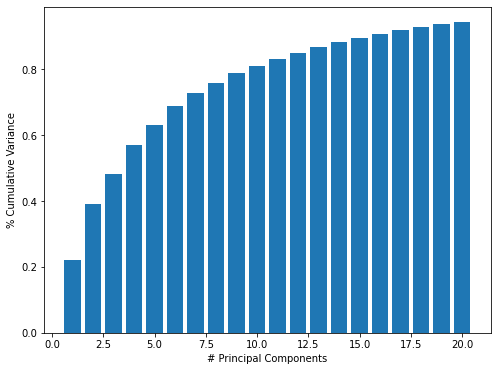

In [6]:
cum_exp_var = []
var_exp = 0
for i in pca.explained_variance_ratio_:
    var_exp += i
    cum_exp_var.append(var_exp)

# Plot cumulative explained variance for all PCs

fig, ax = plt.subplots(figsize=(8,6))
ax.bar(range(1,21), cum_exp_var)
ax.set_xlabel('# Principal Components')
ax.set_ylabel('% Cumulative Variance');

In [7]:
pca.explained_variance_ratio_

array([0.22143425, 0.16851797, 0.09213142, 0.08800173, 0.06151173,
       0.05784391, 0.03947719, 0.02957104, 0.02898775, 0.02342824,
       0.02005332, 0.01888711, 0.01755324, 0.01516364, 0.01337228,
       0.01257713, 0.01059232, 0.008981  , 0.00833446, 0.0067636 ])

In [8]:
# Calculate the variance explained by priciple components
print('Variance of each component:', pca.explained_variance_ratio_)
print('\n Total Variance Explained:', round(sum(list(pca.explained_variance_ratio_))*100, 10))

Variance of each component: [0.22143425 0.16851797 0.09213142 0.08800173 0.06151173 0.05784391
 0.03947719 0.02957104 0.02898775 0.02342824 0.02005332 0.01888711
 0.01755324 0.01516364 0.01337228 0.01257713 0.01059232 0.008981
 0.00833446 0.0067636 ]

 Total Variance Explained: 94.3183311063


In [9]:
X_centered = X - np.mean(X, axis=0)
cov_matrix = np.dot(X_centered.T, X_centered) / 20
eigenvalues = pca.explained_variance_
eigenvalue_arr = []
eigenvector_arr=[]
for eigenvalue, eigenvector in zip(eigenvalues, pca.components_):    
    print("\n\nEigenvector:",np.dot(eigenvector.T, np.dot(cov_matrix, eigenvector)))
    print("Eigenvalue:",eigenvalue)
    eigenvector_arr.append(np.dot(eigenvector.T, np.dot(cov_matrix, eigenvector)))
    eigenvalue_arr.append(eigenvalue)



Eigenvector: 451.7258778553367
Eigenvalue: 13.305622322690303


Eigenvector: 343.7766618790827
Eigenvalue: 10.125969422064289


Eigenvector: 187.94809049666065
Eigenvalue: 5.53602622965126


Eigenvector: 179.52351948737095
Eigenvalue: 5.287879808169968


Eigenvector: 125.48392254120955
Eigenvalue: 3.6961391028336674


Eigenvector: 118.00157204521446
Eigenvalue: 3.475745862892275


Eigenvector: 80.53345808331323
Eigenvalue: 2.372119531172156


Eigenvector: 60.3249240163896
Eigenvalue: 1.7768755231468665


Eigenvector: 59.1350105638349
Eigenvalue: 1.7418265261564267


Eigenvector: 47.79360591544481
Eigenvalue: 1.407764533543778


Eigenvector: 40.908780229096806
Eigenvalue: 1.2049714352103296


Eigenvector: 38.529709258054844
Eigenvalue: 1.134895706073164


Eigenvector: 35.808601550822516
Eigenvalue: 1.0547452580624213


Eigenvector: 30.933818626418002
Eigenvalue: 0.9111581169835399


Eigenvector: 27.279450383194543
Eigenvalue: 0.8035184124239783


Eigenvector: 25.657344732581087
Eigenv

Text(0, 0.5, 'eigenvalues')

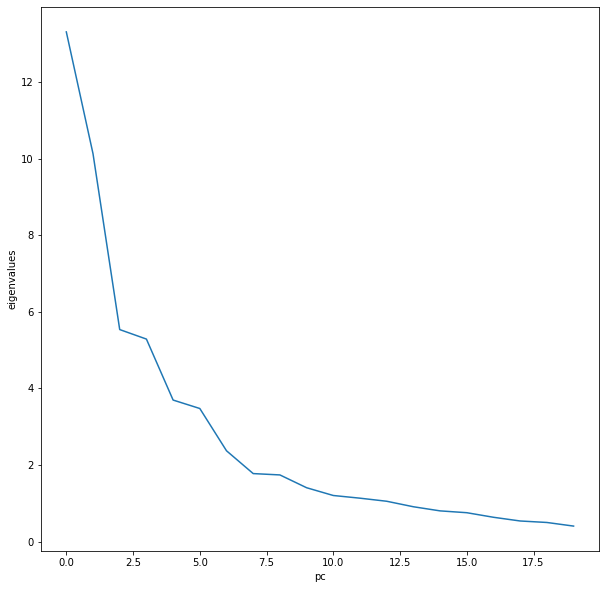

In [10]:


plt.figure(figsize=(10,10))

#plt.plot(eigenvector_arr)
plt.plot(eigenvalue_arr)
plt.xlabel('pc')
plt.ylabel('eigenvalues')



Text(0.5, 1.0, 'Percentage %')

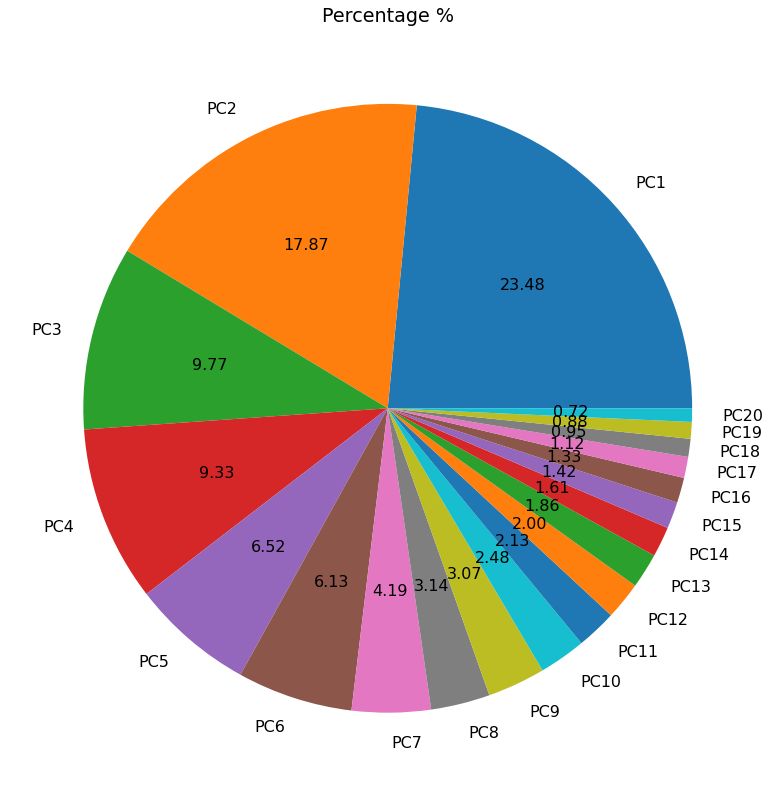

In [11]:
lb = ['PC1', 'PC2','PC3', 'PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20']
plt.figure(figsize=(14,14))
plt.rcParams.update({'font.size':16})#figure.figsize':[10,10],
plt.pie(eigenvalue_arr,labels = lb, autopct = '%0.2f')
plt.title("Percentage %")



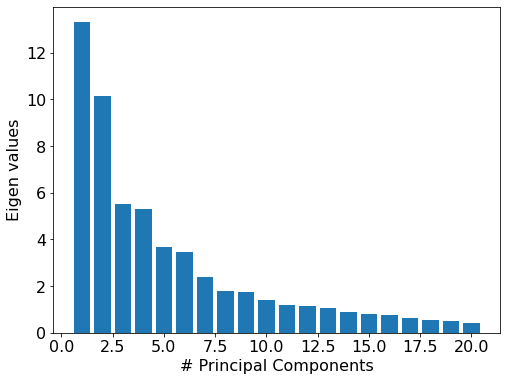

In [12]:
lb = ['PC1', 'PC2','PC3', 'PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20']

fig, ax = plt.subplots(figsize=(8,6))
ax.bar(range(1,21), eigenvalue_arr)
ax.set_xlabel('# Principal Components')
ax.set_ylabel('Eigen values');

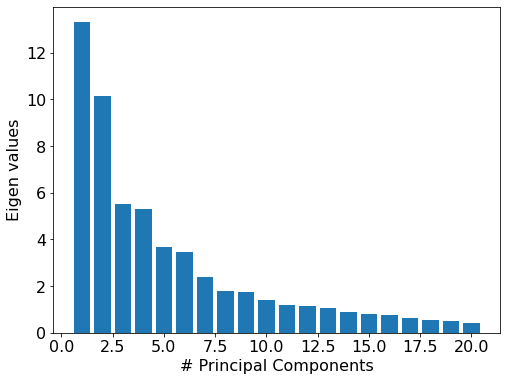

In [13]:
lb = ['PC1', 'PC2','PC3', 'PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20']

fig, ax = plt.subplots(figsize=(8,6))
ax.bar(range(1,21), eigenvalue_arr)
ax.set_xlabel('# Principal Components')
ax.set_ylabel('Eigen values');

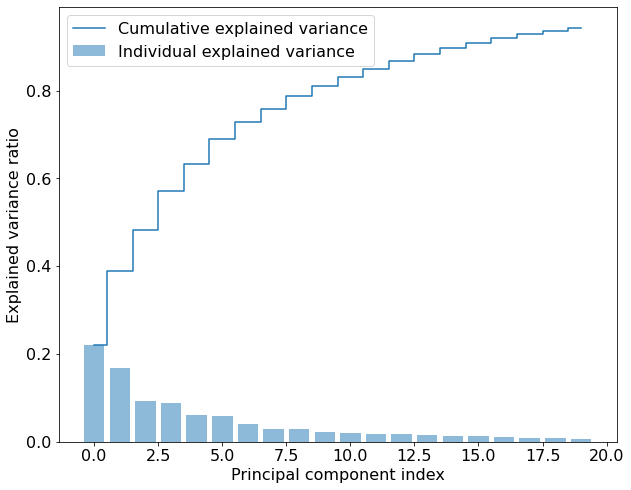

In [14]:

exp_var_pca = pca.explained_variance_ratio_
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#
# Create the visualization plot
#
plt.figure(figsize=(10,8))
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
#plt.tight_layout()
plt.show()

In [15]:
#parallel cocordinate graph
# Import the library
import plotly.express as px

# Create the chart:
fig = px.parallel_coordinates(
    principalDf, 
    color=prosody_data["Hired3C"], 
    color_continuous_scale=px.colors.diverging.Tealrose,
    color_continuous_midpoint=1)

# Hide the color scale that is useless in this case
fig.update_layout(coloraxis_showscale=False)

# Show the plot
fig.show()

In [16]:
df=finalDf[['PC1', 'PC2','PC3', 'PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20']]
import plotly.graph_objects as go

import pandas as pd

fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = finalDf["Hired3C"],colorscale = [[0, 'green'], [0.5, 'red'], [1.0, 'rgb(0,0 , 255)']],showscale = True),
        #line = dict(color = MRH,colorscale = 'Electric', showscale = True, cmin = -4000, cmax = -100),
         dimensions = list([
            dict(range = [min(df['PC1']),max(df['PC1'])], constraintrange = [-12,12], label = 'PC1', values = df['PC1']),
            dict(range = [min(df['PC2']),max(df['PC2'])], label = 'PC2', values = df['PC2']),
            dict(range = [min(df['PC3']),max(df['PC3'])], label = 'PC3', values = df['PC3']),
            dict(range = [min(df['PC4']),max(df['PC4'])], label = 'PC4', values = df['PC4']),
            dict(range = [min(df['PC5']),max(df['PC5'])], label = 'PC5', values = df['PC5']),
            dict(range = [min(df['PC6']),max(df['PC6'])], label = 'PC6', values = df['PC6']),
            dict(range = [min(df['PC7']),max(df['PC7'])], label = 'PC7', values = df['PC7']),
            dict(range = [min(df['PC8']),max(df['PC8'])], label = 'PC8', values = df['PC8']),
            dict(range = [min(df['PC9']),max(df['PC9'])], label = 'PC9', values = df['PC9']),
            dict(range = [min(df['PC10']),max(df['PC10'])], label = 'PC10', values = df['PC10']),
            dict(range = [min(df['PC11']),max(df['PC11'])], label = 'PC11', values = df['PC11']),
            dict(range = [min(df['PC12']),max(df['PC12'])], label = 'PC12', values = df['PC12']),
            dict(range = [min(df['PC13']),max(df['PC13'])], label = 'PC13', values = df['PC13']),
            dict(range = [min(df['PC14']),max(df['PC14'])], label = 'PC14', values = df['PC14']),
            dict(range = [min(df['PC15']),max(df['PC15'])], label = 'PC15', values = df['PC15']),
            dict(range = [min(df['PC16']),max(df['PC16'])], label = 'PC16', values = df['PC16']),
            dict(range = [min(df['PC17']),max(df['PC17'])], label = 'PC17', values = df['PC17']),
            dict(range = [min(df['PC18']),max(df['PC18'])], label = 'PC18', values = df['PC18']),
            dict(range = [min(df['PC19']),max(df['PC19'])], label = 'PC19', values = df['PC19']),
            dict(range = [min(df['PC20']),max(df['PC20'])], label = 'PC20', values = df['PC20'])
            
        ])
       
    )
)

fig.update_layout(
    plot_bgcolor = 'white',
    paper_bgcolor = 'white'
)

fig.show()

In [17]:
df=finalDf[['PC1', 'PC2','PC3', 'PC4','PC5','PC6','PC7','PC8','PC9','PC10']]
import plotly.graph_objects as go

import pandas as pd

fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = finalDf["Hired3C"],colorscale = [[0, 'green'], [0.5, 'red'], [1.0, 'rgb(0,0 , 255)']],showscale = True),
        #line = dict(color = MRH,colorscale = 'Electric', showscale = True, cmin = -4000, cmax = -100),
         dimensions = list([
            dict(range = [min(df['PC1']),max(df['PC1'])], constraintrange = [-12,12], label = 'PC1', values = df['PC1']),
            dict(range = [min(df['PC2']),max(df['PC2'])], label = 'PC2', values = df['PC2']),
            dict(range = [min(df['PC3']),max(df['PC3'])], label = 'PC3', values = df['PC3']),
            dict(range = [min(df['PC4']),max(df['PC4'])], label = 'PC4', values = df['PC4']),
            dict(range = [min(df['PC5']),max(df['PC5'])], label = 'PC5', values = df['PC5']),
            dict(range = [min(df['PC6']),max(df['PC6'])], label = 'PC6', values = df['PC6']),
            dict(range = [min(df['PC7']),max(df['PC7'])], label = 'PC7', values = df['PC7']),
            dict(range = [min(df['PC8']),max(df['PC8'])], label = 'PC8', values = df['PC8']),
            dict(range = [min(df['PC9']),max(df['PC9'])], label = 'PC9', values = df['PC9']),
            dict(range = [min(df['PC10']),max(df['PC10'])], label = 'PC10', values = df['PC10'])
            
        ])
       
    )
)

fig.update_layout(
    plot_bgcolor = 'white',
    paper_bgcolor = 'white'
)

fig.show()

In [18]:
df=finalDf[['PC1', 'PC2','PC3', 'PC4','PC5','PC6','PC7','PC8','PC9','PC10']]
import plotly.graph_objects as go

import pandas as pd

fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = finalDf["Hired3C"],colorscale = [[0, 'green'], [0.5, 'red'], [1.0, 'rgb(0,0 , 255)']],showscale = True),
        #line = dict(color = MRH,colorscale = 'Electric', showscale = True, cmin = -4000, cmax = -100),
         dimensions = list([
            dict(range = [min(df['PC7']),max(df['PC7'])], constraintrange = [-12,12], label = 'PC7', values = df['PC7']),
            dict(range = [min(df['PC4']),max(df['PC4'])], label = 'PC4', values = df['PC4']),
            
            dict(range = [min(df['PC1']),max(df['PC1'])], label = 'PC1', values = df['PC1']),
            dict(range = [min(df['PC5']),max(df['PC5'])], label = 'PC5', values = df['PC5'])

        ])
       
    )
)

fig.update_layout(
    plot_bgcolor = 'white',
    paper_bgcolor = 'white'
)

fig.show()

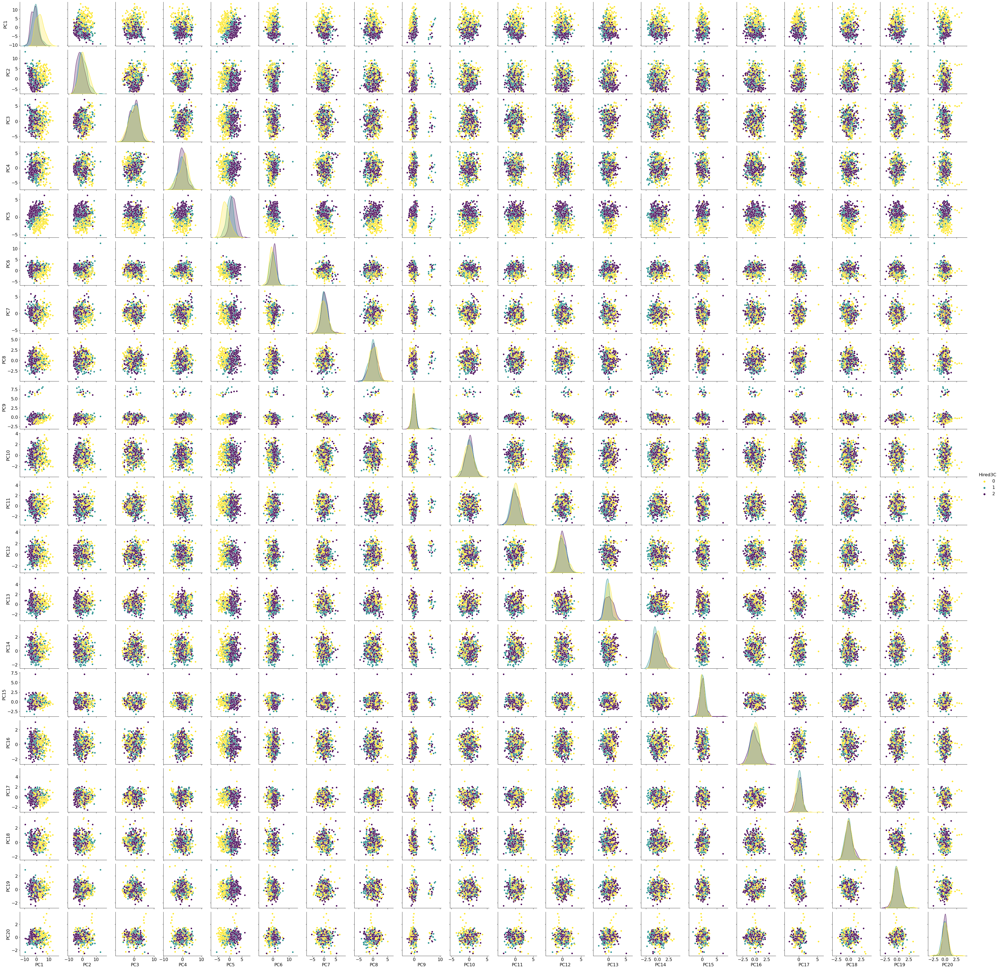

In [19]:
df1=finalDf[['PC1', 'PC2','PC3', 'PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20','Hired3C']]
sns.pairplot(df1,hue='Hired3C',palette='viridis_r')

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\A

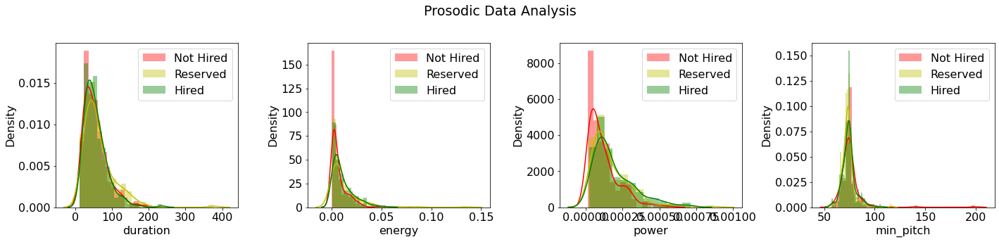

In [20]:
pfinalDf= pd.read_csv('Prosodic_Features_MRH.csv',sep=",")

df1=pfinalDf[['duration', 'energy', 'power', 'min_pitch']]
fig = plt.figure(figsize = (20, 25))
j = 0
for i in df1.columns:
    plt.subplot(6, 4, j+1)
    j += 1
    sns.distplot(df1[i][finalDf['Hired3C']==0], color='r', label = 'Not Hired')
    sns.distplot(df1[i][finalDf['Hired3C']==1], color='y', label = 'Reserved')
    sns.distplot(df1[i][finalDf['Hired3C']==2], color='g', label = 'Hired')
    plt.legend(loc='best')
fig.suptitle('Prosodic Data Analysis')
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\A

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\Anagha\anaconda3\envs\tf\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\A

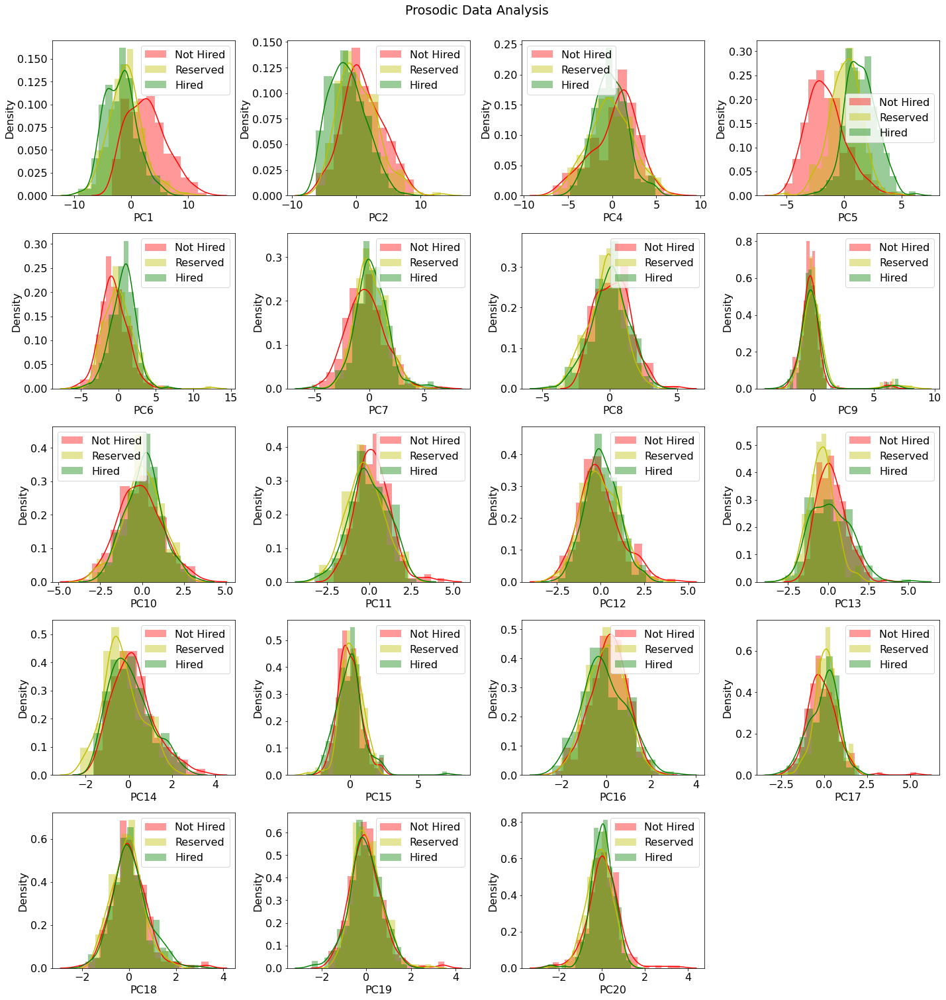

In [21]:
df1=finalDf[['PC1', 'PC2', 'PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11', 'PC12','PC13', 'PC14','PC15', 'PC16','PC17', 'PC18','PC19', 'PC20']]
fig = plt.figure(figsize = (20, 25))
j = 0
for i in df1.columns:
    plt.subplot(6, 4, j+1)
    j += 1
    sns.distplot(df1[i][finalDf['Hired3C']==0], color='r', label = 'Not Hired')
    sns.distplot(df1[i][finalDf['Hired3C']==1], color='y', label = 'Reserved')
    sns.distplot(df1[i][finalDf['Hired3C']==2], color='g', label = 'Hired')
    plt.legend(loc='best')
fig.suptitle('Prosodic Data Analysis')
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

df1=finalDf[['PC1', 'PC2','PC4','PC5','Hired3C']]
sns.pairplot(df1,hue='Hired3C',kind='kde',palette='viridis_r')

['Not Qualified', 'Highly Qualified', 'Medium Qualified']
Highly Qualified:  225
Medium Qualified:  225
Not Qualified:  230


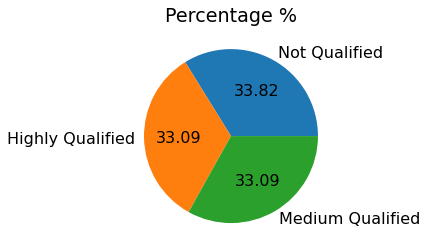

In [22]:
Hr = np.array(prosody_data['Hired3C'].value_counts())
arr = prosody_data['Hired3C']
lb = ['Not Qualified','Highly Qualified','Medium Qualified']
print(lb)
plt.rcParams.update({'font.size':16})#figure.figsize':[10,10],
plt.pie(Hr,labels = lb, autopct = '%0.2f')
plt.title("Percentage %")

arrLB = []
for i in arr:
    if(i==2):
        arrLB.append('Highly Qualified')
    elif(i==1):
        arrLB.append('Medium Qualified')
    else:
        arrLB.append('Not Qualified')
print("Highly Qualified: ",arrLB.count('Highly Qualified'))
print("Medium Qualified: ",arrLB.count('Medium Qualified'))
print("Not Qualified: ",arrLB.count('Not Qualified'))

Text(0, 0.5, 'pc1')

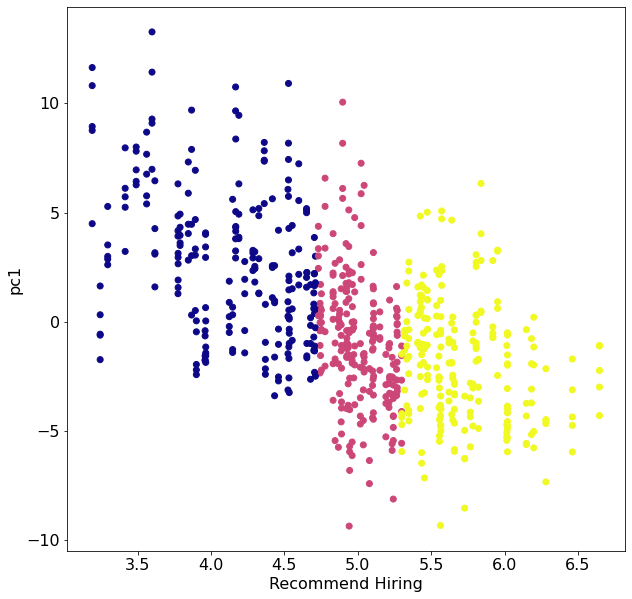

In [23]:
plt.figure(figsize=(10,10))
plt.scatter(prosody_data['RecommendHiring'],X_pca[:,0],c=finalDf['Hired3C'],cmap='plasma')
plt.xlabel('Recommend Hiring')
plt.ylabel('pc1')

Text(0, 0.5, 'pc5')

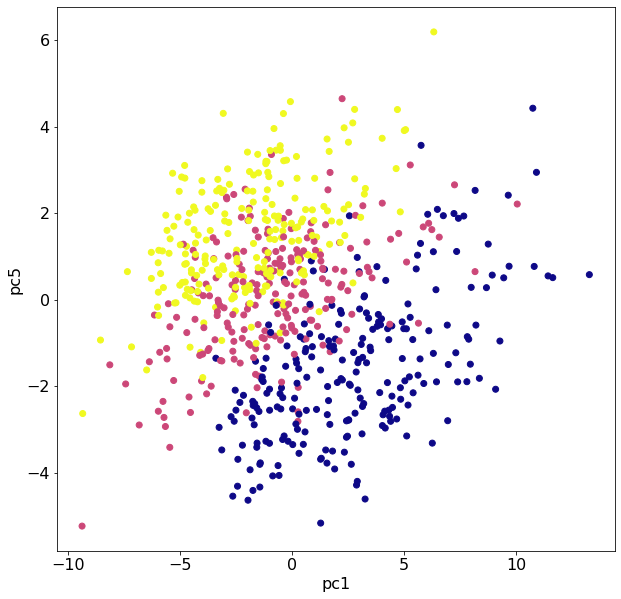

In [24]:
plt.figure(figsize=(10,10))
plt.scatter(X_pca[:,0],X_pca[:,4],c=finalDf['Hired3C'],cmap='plasma')
plt.xlabel('pc1')
plt.ylabel('pc5')

Text(0, 0.5, 'pc8')

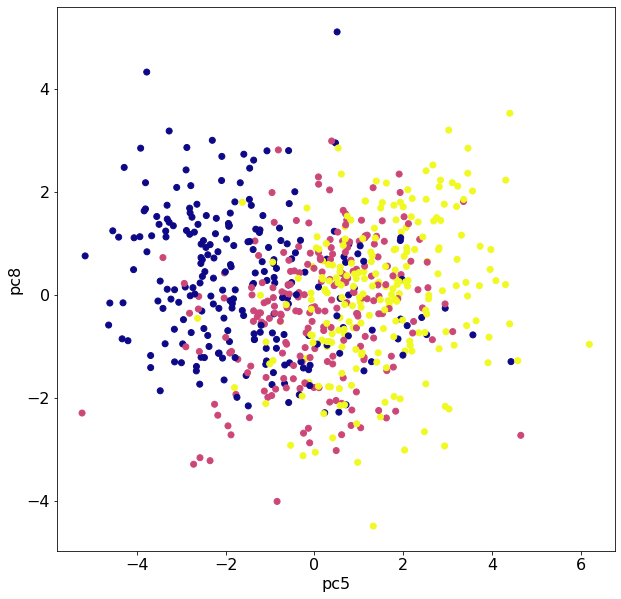

In [25]:
plt.figure(figsize=(10,10))
plt.scatter(X_pca[:,4],X_pca[:,7],c=finalDf['Hired3C'],cmap='plasma')
plt.xlabel('pc5')
plt.ylabel('pc8')

[Text(0.5, 0, 'RecommendHiring')]

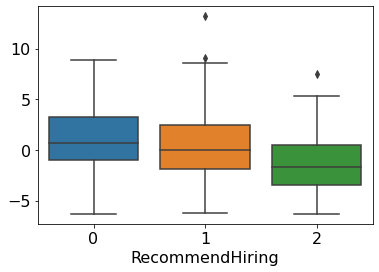

In [26]:
sns.boxplot(x=finalDf['Hired3C'], y=X_pca[:,1],data= finalDf).set(
    xlabel='RecommendHiring', 
)

Text(0.5, 0, 'PC6')

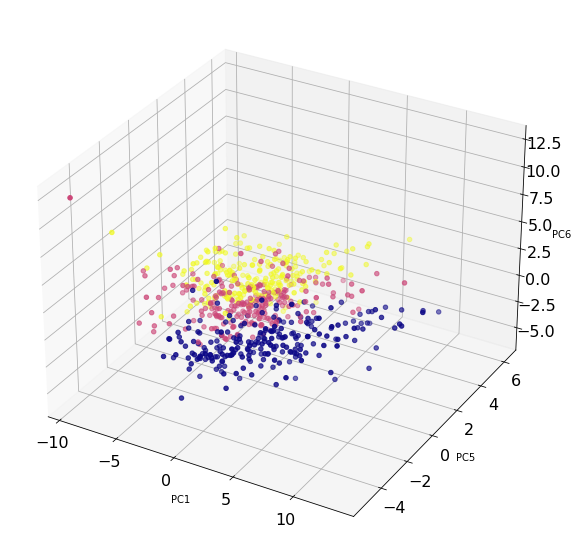

In [27]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(X_pca[:,0],X_pca[:,4],X_pca[:,5], c=finalDf['Hired3C'],cmap='plasma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC5", fontsize=10)
axis.set_zlabel("PC6", fontsize=10)

Text(0.5, 0, 'PC9')

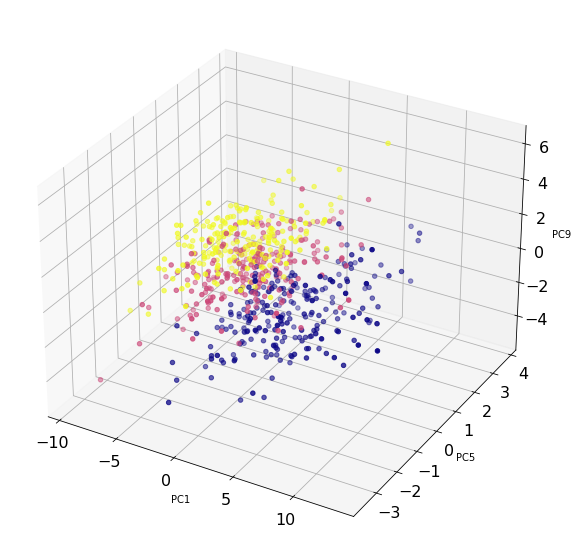

In [28]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(X_pca[:,0],X_pca[:,9],X_pca[:,4], c=finalDf['Hired3C'],cmap='plasma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC5", fontsize=10)
axis.set_zlabel("PC9", fontsize=10)

Text(0.5, 0, 'PC1')

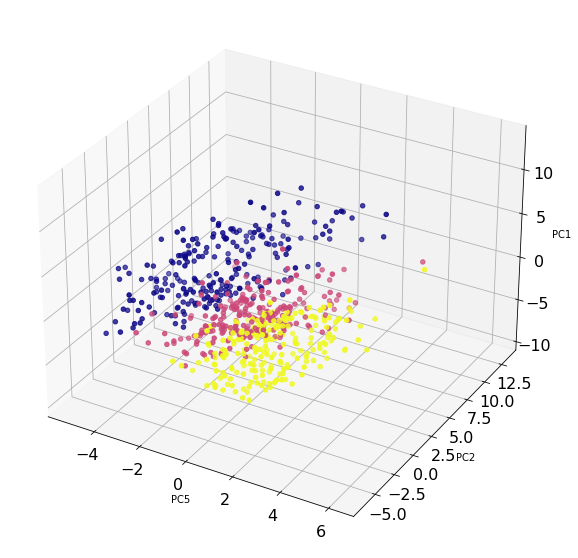

In [29]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(X_pca[:,4],X_pca[:,1],X_pca[:,0], c=finalDf['Hired3C'],cmap='plasma')
axis.set_xlabel("PC5", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC1", fontsize=10)

Text(0.5, 0, 'PC1')

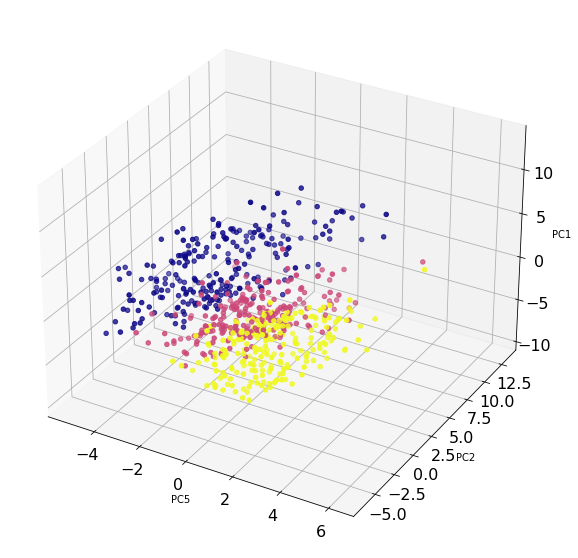

In [30]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(X_pca[:,4],X_pca[:,1],X_pca[:,0], c=finalDf['Hired3C'],cmap='plasma')
axis.set_xlabel("PC5", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC1", fontsize=10)

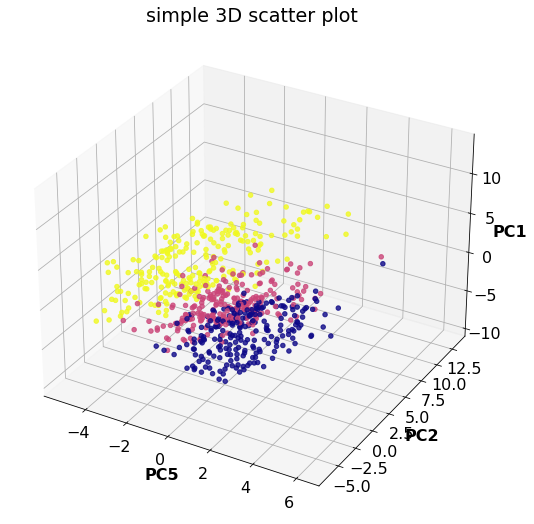

Text(0.5, 0, 'PC5')

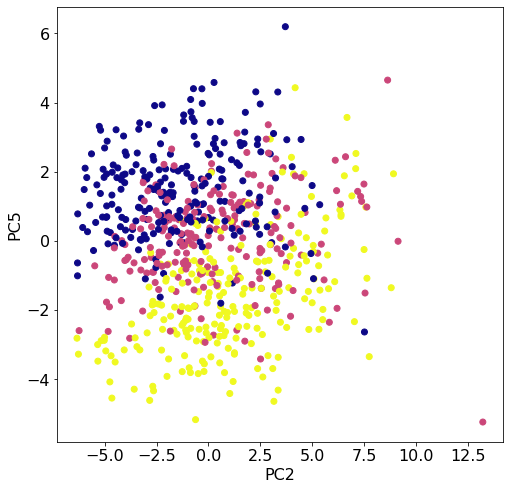

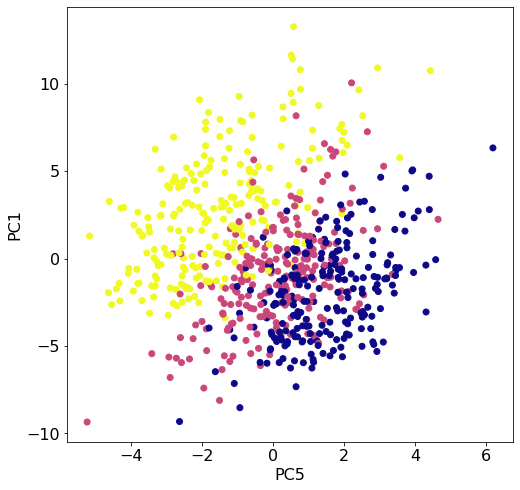

In [36]:
x = finalDf['PC5']
y = finalDf['PC2']
z = finalDf['PC1']

# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
ax.set_facecolor("white")  
# Add x, y gridlines
ax.grid(b = True, color ='black', 
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map plasma ocean RdPu  jet PiYG OrRd GnBu RdGy  RdBu BuGn BrBG viridis
my_cmap = plt.get_cmap('plasma_r') 
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c=finalDf['Hired3C'],
                    cmap = my_cmap,
                    marker ='o')
 
plt.title("simple 3D scatter plot")
ax.set_xlabel('PC5', fontweight ='bold')
ax.set_ylabel('PC2', fontweight ='bold')
ax.set_zlabel('PC1', fontweight ='bold')
#fig.colorbar(sctt, shrink = 0.7, aspect = 5)

plt.show()

fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("white") 
plt.scatter(y, x, c=finalDf['Hired3C'], cmap= 'plasma_r',label=x)
plt.ylabel('PC5')
plt.xlabel('PC2')


fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("white")  
plt.scatter(x, z, c=finalDf['Hired3C'], cmap= 'plasma_r')
plt.ylabel('PC1')
plt.xlabel('PC5')


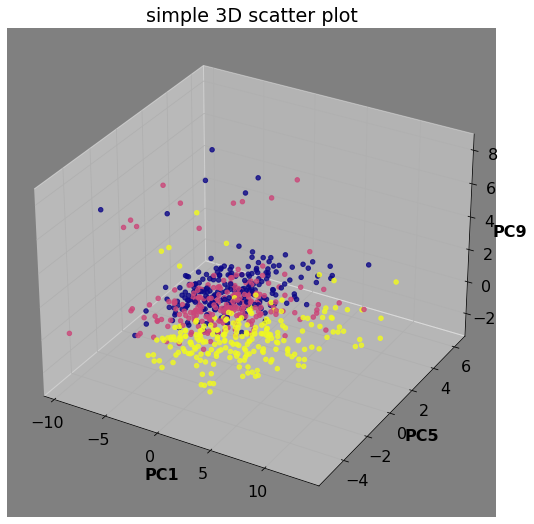

Text(0.5, 0, 'PC9')

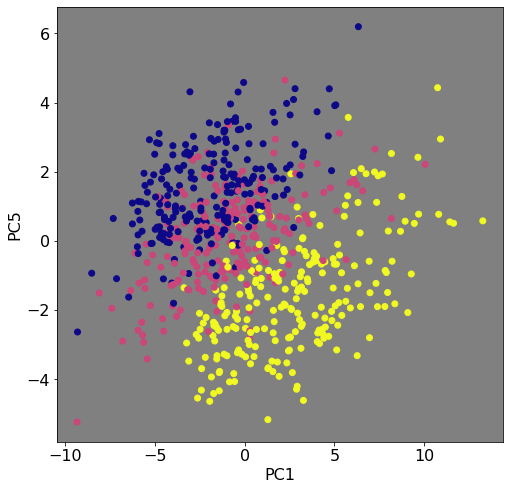

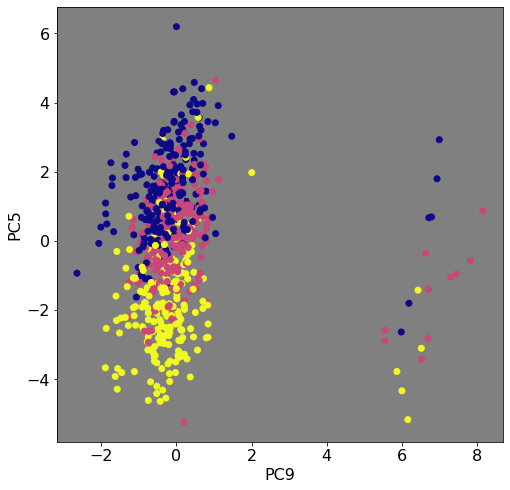

In [32]:
x = finalDf['PC1']
y =finalDf['PC5']
z = finalDf['PC9']

# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
ax.set_facecolor("gray")  
# Add x, y gridlines
ax.grid(b = True, color ='black', 
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map plasma ocean RdPu  jet PiYG OrRd GnBu RdGy  RdBu BuGn BrBG viridis
my_cmap = plt.get_cmap('plasma_r') 
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c=finalDf['Hired3C'],
                    cmap = my_cmap,
                    marker ='o')
 
plt.title("simple 3D scatter plot")
ax.set_xlabel('PC1', fontweight ='bold')
ax.set_ylabel('PC5', fontweight ='bold')
ax.set_zlabel('PC9', fontweight ='bold')
#fig.colorbar(sctt, shrink = 0.7, aspect = 5)

plt.show()

fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray") 
plt.scatter(x, y, c=finalDf['Hired3C'], cmap= 'plasma_r',label=x)
plt.ylabel('PC5')
plt.xlabel('PC1')



fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray")  
plt.scatter(z, y,c=finalDf['Hired3C'], cmap= 'plasma_r')
plt.ylabel('PC5')
plt.xlabel('PC9')


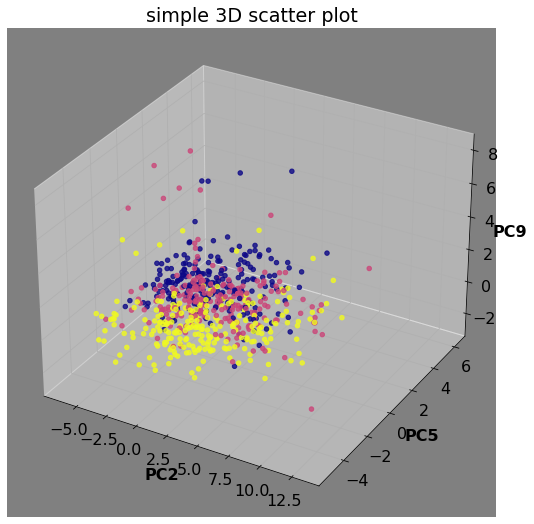

Text(0.5, 0, 'PC9')

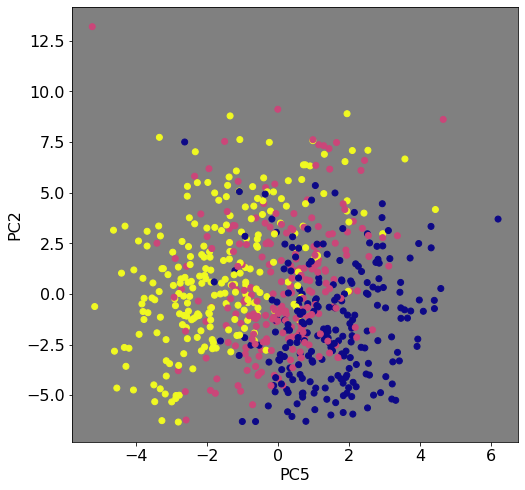

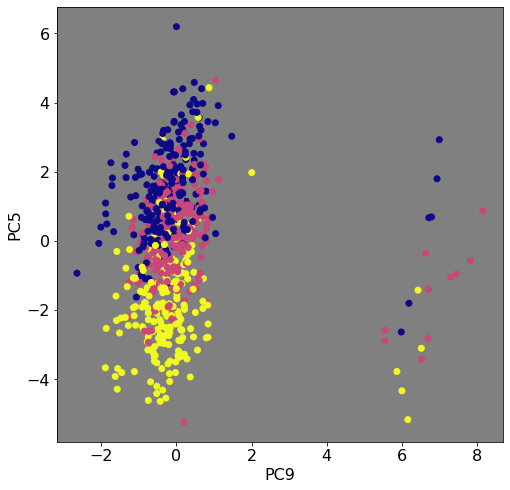

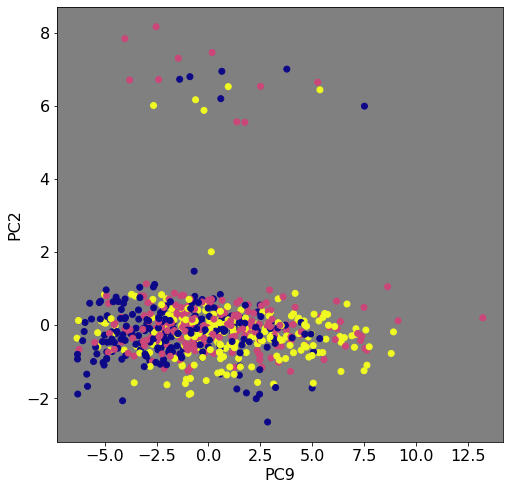

In [33]:
x = finalDf['PC2']
y =finalDf['PC5']
z = finalDf['PC9']

# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
ax.set_facecolor("gray")  
# Add x, y gridlines
ax.grid(b = True, color ='black', 
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map plasma ocean RdPu  jet PiYG OrRd GnBu RdGy  RdBu BuGn BrBG viridis
my_cmap = plt.get_cmap('plasma_r') 
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c=finalDf['Hired3C'],
                    cmap = my_cmap,
                    marker ='o')
 
plt.title("simple 3D scatter plot")
ax.set_xlabel('PC2', fontweight ='bold')
ax.set_ylabel('PC5', fontweight ='bold')
ax.set_zlabel('PC9', fontweight ='bold')
#fig.colorbar(sctt, shrink = 0.7, aspect = 5)

plt.show()

fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray") 
plt.scatter(y, x, c=finalDf['Hired3C'], cmap= 'plasma_r',label=x)
plt.ylabel('PC2')
plt.xlabel('PC5')



fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray")  
plt.scatter(z, y,c=finalDf['Hired3C'], cmap= 'plasma_r')
plt.ylabel('PC5')
plt.xlabel('PC9')

fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray")  
plt.scatter(x,z, c=finalDf['Hired3C'], cmap= 'plasma_r')
plt.ylabel('PC2')
plt.xlabel('PC9')


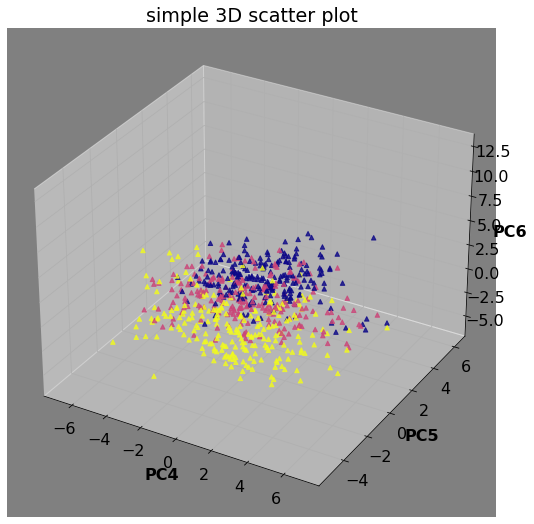

Text(0.5, 0, 'PC6')

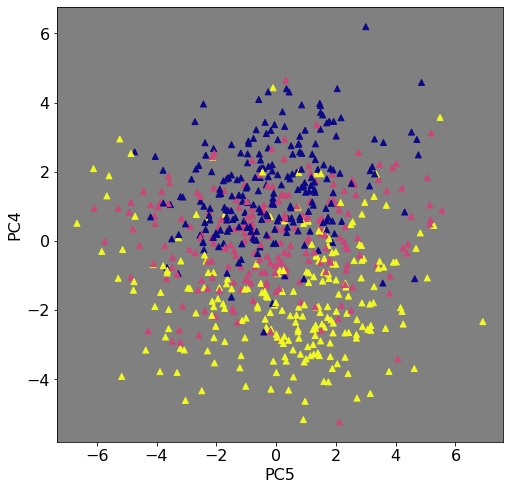

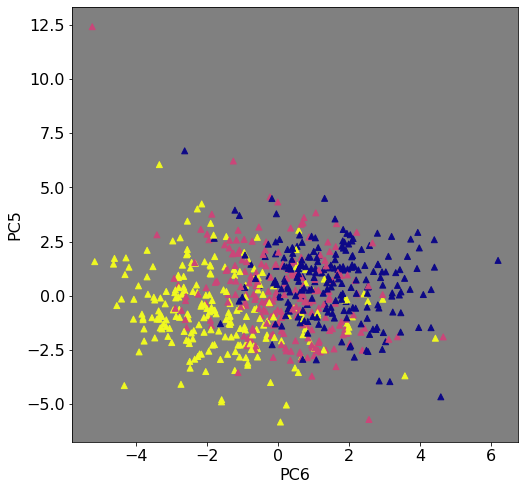

In [34]:
x = finalDf['PC4']
y =finalDf['PC5']
z = finalDf['PC6']

# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
ax.set_facecolor("gray")  
# Add x, y gridlines
ax.grid(b = True, color ='black', 
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map plasma ocean RdPu  jet PiYG OrRd GnBu RdGy  RdBu BuGn BrBG viridis
my_cmap = plt.get_cmap('plasma_r') 
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c=finalDf['Hired3C'],
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("simple 3D scatter plot")
ax.set_xlabel('PC4', fontweight ='bold')
ax.set_ylabel('PC5', fontweight ='bold')
ax.set_zlabel('PC6', fontweight ='bold')
#fig.colorbar(sctt, shrink = 0.7, aspect = 5)

plt.show()

fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray") 
plt.scatter(x, y, c=finalDf['Hired3C'], cmap= 'plasma_r',label=x,marker ='^')
plt.ylabel('PC4')
plt.xlabel('PC5')



fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray")  
plt.scatter(y, z, c=finalDf['Hired3C'], cmap= 'plasma_r',marker ='^')
plt.ylabel('PC5')
plt.xlabel('PC6')


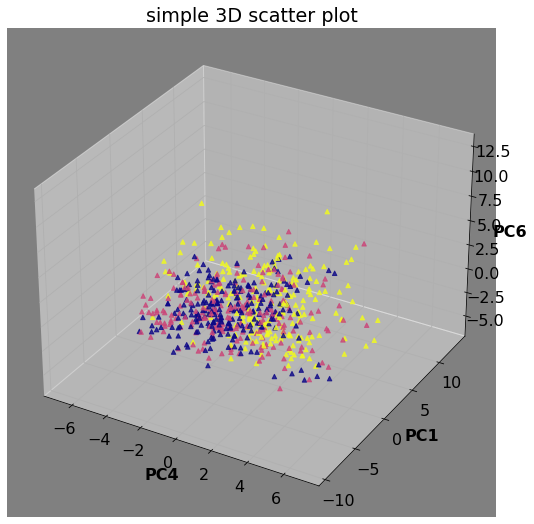

Text(0.5, 0, 'PC6')

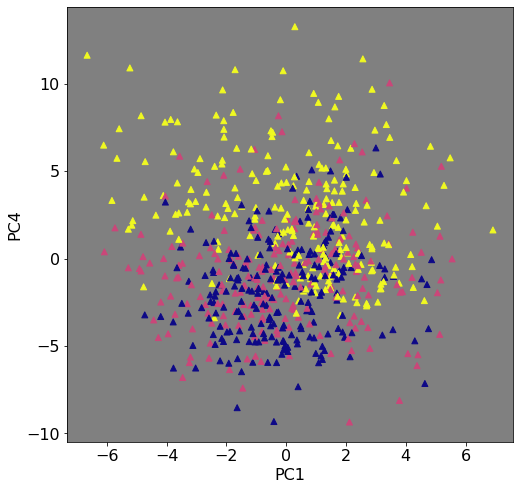

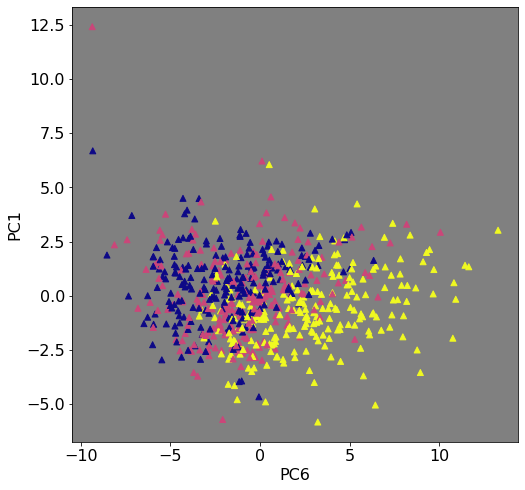

In [35]:
x = finalDf['PC4']
y = finalDf['PC1']
z = finalDf['PC6']

# Creating figure
fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")
ax.set_facecolor("gray")  
# Add x, y gridlines
ax.grid(b = True, color ='black', 
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
 
 
# Creating color map plasma ocean RdPu  jet PiYG OrRd GnBu RdGy  RdBu BuGn BrBG viridis
my_cmap = plt.get_cmap('plasma_r') 
 
# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c=finalDf['Hired3C'],
                    cmap = my_cmap,
                    marker ='^')
 
plt.title("simple 3D scatter plot")
ax.set_xlabel('PC4', fontweight ='bold')
ax.set_ylabel('PC1', fontweight ='bold')
ax.set_zlabel('PC6', fontweight ='bold')
#fig.colorbar(sctt, shrink = 0.7, aspect = 5)

plt.show()

fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray") 
plt.scatter(x, y, c=finalDf['Hired3C'], cmap= 'plasma_r',label=x,marker ='^')
plt.ylabel('PC4')
plt.xlabel('PC1')



fig = plt.figure(figsize=(8,8))
ax = plt.axes()
ax.set_facecolor("gray")  
plt.scatter(y, z, c=finalDf['Hired3C'], cmap= 'plasma_r',marker ='^')
plt.ylabel('PC1')
plt.xlabel('PC6')
